# Optimizing Carbon Emissions in Freight Vehicles Using Data Analytics

+ Data Preprocessing 
+ Goodness-of-Fit Test

In [147]:
# Load Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import seaborn as sns
import pandas_profiling as pp

pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
import mpl_toolkits
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler 

from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV

from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

import tensorflow as tf
from keras import models, layers
from tensorflow import keras
from pylab import rcParams

from matplotlib import rc
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

# Modeling Libraries
from sklearn import linear_model
from sklearn.metrics import make_scorer
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import svm
from sklearn.metrics import r2_score
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from subprocess import check_output

%matplotlib inline

%config InlineBackend.figure_format='retina'
sns.set(style='whitegrid', palette='muted', font_scale=1.5)
rcParams['figure.figsize'] = 16, 10
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

import os
# Hide Warnings
import warnings
warnings.filterwarnings('ignore')

# Data Exploration

In [148]:
# Loading the French the Dataset
data = pd.read_csv('fic_etiq_edition_40-mars-2015.csv', sep = ';', encoding="latin1")

In [149]:
# View Data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20880 entries, 0 to 20879
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   lib_mrq_doss       20880 non-null  object 
 1   lib_mod_doss       20880 non-null  object 
 2   mrq_utac           20880 non-null  object 
 3   mod_utac           20880 non-null  object 
 4   dscom              20880 non-null  object 
 5   cnit               20880 non-null  object 
 6   tvv                20880 non-null  object 
 7   energ              20880 non-null  object 
 8   hybride            20880 non-null  object 
 9   puiss_admin        20880 non-null  int64  
 10  puiss_max          20824 non-null  float64
 11  puiss_heure        895 non-null    float64
 12  typ_boite_nb_rapp  20880 non-null  object 
 13  conso_urb_93       20759 non-null  float64
 14  conso_exurb        20759 non-null  float64
 15  conso_mixte        20824 non-null  float64
 16  co2_mixte          208

Intial Summary Statistics

In [150]:
data.describe()

,puiss_admin,puiss_max,puiss_heure,conso_urb_93,conso_exurb,conso_mixte,co2_mixte,co_typ_1,hc,nox,hcnox,ptcl,masse_ordma_min,masse_ordma_max
count,20880.000000,20824.000000,895.000000,20759.000000,20759.000000,20824.000000,20824.000000,20605.000000,8897.000000,20605.000000,11735.000000,19170.000000,20880.000000,20880.000000
mean,12.390134,146.085315,32.630726,7.743307,5.348755,6.216246,154.584326,0.256855,0.042104,0.093032,0.142602,0.000699,1810.563649,1846.491140
std,9.751439,80.113755,16.984350,2.957154,1.389960,1.926168,44.247481,0.119007,0.012890,0.085165,0.072383,0.000958,371.924329,429.122546
min,1.000000,28.000000,0.500000,0.000000,2.600000,0.600000,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,875.000000,875.000000
25%,8.000000,100.000000,20.000000,5.800000,4.300000,4.800000,122.000000,0.177000,0.033000,0.030000,0.077000,0.000000,1505.000000,1505.750000
50%,9.000000,120.000000,20.000000,7.100000,5.200000,5.800000,147.000000,0.249000,0.042000,0.056000,0.117000,0.000000,1760.000000,1760.000000
75%,12.000000,150.000000,48.000000,8.600000,6.200000,7.100000,180.000000,0.308000,0.051000,0.160000,0.213000,0.001000,2050.000000,2050.000000
max,80.000000,585.000000,85.000000,27.300000,13.700000,17.200000,398.000000,0.968000,0.084000,0.317000,0.301000,0.004000,2765.000000,3084.000000


### Variable Selection

Rename Features from French to English

In [151]:
# Variable Selection
data = data[["lib_mrq_doss", "lib_mod_doss", "energ", "hybride", "puiss_max", "typ_boite_nb_rapp", 
                 "conso_urb_93", "conso_exurb" , "conso_mixte", "co2_mixte", "co_typ_1", 
                 "hc", "nox", "hcnox", "ptcl", "masse_ordma_min", "masse_ordma_max"]]

In [152]:
# Renaming Variables to Appr
data.columns = ["Make", "Model", "Gas", "Hybrid", "Max_HP", "Gear", "City_Mileage", "Hway_Mileage" , "Mix_Mileage", 
                "CO2", "CO_1", "HC", "NOC", "HCNOX", "PTCL", "Min_Wght", "Max_Wght"
]

Preliminary Data Profiling

In [153]:
pp.ProfileReport(data)

Data View and Summary Statistics

In [140]:
data.describe()

,Max_HP,City_Mileage,Hway_Mileage,Mix_Mileage,CO2,CO_1,HC,NOC,HCNOX,PTCL,Min_Wght,Max_Wght
count,20824.000000,20759.000000,20759.000000,20824.000000,20824.000000,20605.000000,8897.000000,20605.000000,11735.000000,19170.000000,20880.000000,20880.000000
mean,146.085315,7.743307,5.348755,6.216246,154.584326,0.256855,0.042104,0.093032,0.142602,0.000699,1810.563649,1846.491140
std,80.113755,2.957154,1.389960,1.926168,44.247481,0.119007,0.012890,0.085165,0.072383,0.000958,371.924329,429.122546
min,28.000000,0.000000,2.600000,0.600000,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,875.000000,875.000000
25%,100.000000,5.800000,4.300000,4.800000,122.000000,0.177000,0.033000,0.030000,0.077000,0.000000,1505.000000,1505.750000
50%,120.000000,7.100000,5.200000,5.800000,147.000000,0.249000,0.042000,0.056000,0.117000,0.000000,1760.000000,1760.000000
75%,150.000000,8.600000,6.200000,7.100000,180.000000,0.308000,0.051000,0.160000,0.213000,0.001000,2050.000000,2050.000000
max,585.000000,27.300000,13.700000,17.200000,398.000000,0.968000,0.084000,0.317000,0.301000,0.004000,2765.000000,3084.000000


Checking for Skweness

In [154]:
data.skew(axis = 0, skipna = True)

Max_HP          2.074510
City_Mileage    1.965753
Hway_Mileage    1.048611
Mix_Mileage     1.521684
CO2             1.291589
CO_1            1.192690
HC              0.000841
NOC             1.083037
HCNOX           0.306944
PTCL            1.861799
Min_Wght        0.336964
Max_Wght        0.702463
dtype: float64

In [155]:
data.kurt

<bound method DataFrame.kurt of               Make  Model  Gas Hybrid  Max_HP  Gear  City_Mileage  \
0      ALFA ROMEO    159   ES    non    147.0  M 6           11.3   
1      ALFA ROMEO    159   GO    non    125.0  M 6            6.6   
2      ALFA ROMEO    159   GO    non    100.0  M 6            6.6   
3      ALFA ROMEO    159   GO    non    100.0  M 6            6.6   
4      ALFA ROMEO    159   GO    non    125.0  M 6            6.9   
...            ...    ...  ...    ...     ...   ...           ...   
20875       VOLVO   XC90   ES    non    235.0  A 8            9.8   
20876       VOLVO   XC90   GO    non    165.0  A 8            6.2   
20877       VOLVO   XC90   GO    non    165.0  A 8            6.2   
20878       VOLVO   XC90   GO    non    165.0  A 8            6.4   
20879       VOLVO   XC90   GO    non    165.0  A 8            6.4   

       Hway_Mileage  Mix_Mileage    CO2   CO_1     HC    NOC  HCNOX   PTCL  \
0               5.8          7.8  182.0  0.647  0.052  0.032 

### Missing Data Identification and Treatment
+ a. Indetify Missing Values
+ b. Drop Features (with more than 50% NAs or are Irrelevant to the Research)
+ c. Mean Imputation of NAs


In [156]:
# Function to Identify Missing Values in all Features

def identify_NAs(data):
    
    NAs = []
    for column_name in data.columns:
        miss_count = data[column_name].isnull().sum(axis=0)
        miss_percent=miss_count/data.shape[0]
        NAs.append([column_name,miss_count,miss_percent*100])
        data_stats = pd.DataFrame.from_records( NAs, columns = ['Feature Name','Missing Count','Missing Percentage'])  
        data_stats = data_stats.sort_values('Missing Percentage',axis=0, ascending = False )
    return data_stats

data_stats = identify_NAs(data)

data_stats

,Feature Name,Missing Count,Missing Percentage
11,HC,11983,57.389847
13,HCNOX,9145,43.797893
14,PTCL,1710,8.189655
12,NOC,275,1.317050
10,CO_1,275,1.317050
6,City_Mileage,121,0.579502
7,Hway_Mileage,121,0.579502
8,Mix_Mileage,56,0.268199
4,Max_HP,56,0.268199
9,CO2,56,0.268199


Text(0.5, 0, 'Feature Name')

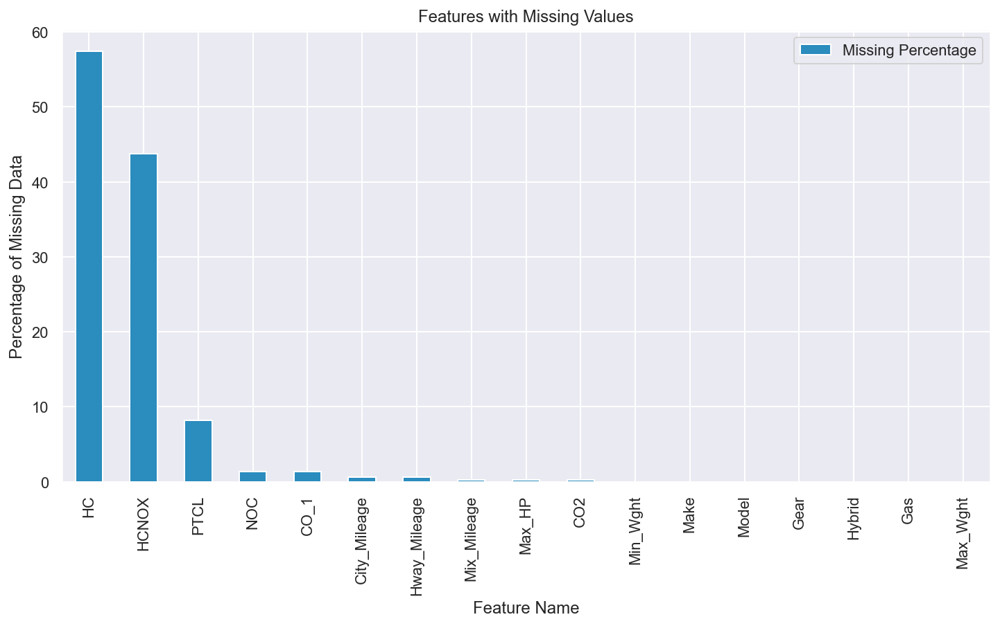

In [157]:
# Visualizing Missing Values
sns.set()
data_stats.plot.bar(x='Feature Name', y='Missing Percentage', figsize=(12,6), grid=True, color = '#2b8cbe')
plt.title('Features with Missing Values')
plt.ylabel('Percentage of Missing Data')
plt.xlabel('Feature Name')

Dropping the HC Feature
+ According to research, missing data with more than 50% in a feature can be dropped.
HC has 57% missing data.

In [158]:
data.drop('HC', inplace=True, axis=1)

Mean Imputation of Missing Values
+ Summary Statistics Before and After Imputation
+ Replacing Null Values with the Mean of the Feature.

In [159]:
# Descriptive Statistics Before
missing_values = list(['HCNOX','PTCL','NOC','CO_1','City_Mileage','Hway_Mileage','Mix_Mileage','Max_HP','CO2'])

print('Descriptive Statistics Before Imputation: \n', '--'*34)
display(data[missing_values ].describe().T)

Descriptive Statistics Before Imputation: 
 --------------------------------------------------------------------


,count,mean,std,min,25%,50%,75%,max
HCNOX,11735.0,0.142602,0.072383,0.0,0.077,0.117,0.213,0.301
PTCL,19170.0,0.000699,0.000958,0.0,0.000,0.000,0.001,0.004
NOC,20605.0,0.093032,0.085165,0.0,0.030,0.056,0.160,0.317
CO_1,20605.0,0.256855,0.119007,0.0,0.177,0.249,0.308,0.968
City_Mileage,20759.0,7.743307,2.957154,0.0,5.800,7.100,8.600,27.300
Hway_Mileage,20759.0,5.348755,1.389960,2.6,4.300,5.200,6.200,13.700
Mix_Mileage,20824.0,6.216246,1.926168,0.6,4.800,5.800,7.100,17.200
Max_HP,20824.0,146.085315,80.113755,28.0,100.000,120.000,150.000,585.000
CO2,20824.0,154.584326,44.247481,13.0,122.000,147.000,180.000,398.000


In [160]:
# Mean Imputation
data['PTCL'].fillna(data['PTCL'].mean(), inplace=True)
data['CO_1'].fillna(data['CO_1'].mean(), inplace=True)
data['NOC'].fillna(data['NOC'].mean(), inplace=True)                         
data['HCNOX'].fillna(data['HCNOX'].mean(), inplace=True)
data['CO2'].fillna(data['CO2'].mean(), inplace=True)
data['Max_HP'].fillna(data['Max_HP'].mean(), inplace=True)
data['Mix_Mileage'].fillna(data['Mix_Mileage'].mean(), inplace=True)
data['Hway_Mileage'].fillna(data['Hway_Mileage'].mean(), inplace=True)
data['City_Mileage'].fillna(data['City_Mileage'].mean(), inplace=True)

In [161]:
# Descriptive Statistics After Imputation
imputed_values = list(['HCNOX','PTCL','NOC','CO_1','City_Mileage','Hway_Mileage','Mix_Mileage','Max_HP','CO2'])

print('Descriptive Statistics After Imputation: \n', '--'*34)
display(data[imputed_values ].describe().T)

Descriptive Statistics After Imputation: 
 --------------------------------------------------------------------


,count,mean,std,min,25%,50%,75%,max
HCNOX,20880.0,0.142602,0.054263,0.0,0.102,0.142602,0.160,0.301
PTCL,20880.0,0.000699,0.000918,0.0,0.000,0.000699,0.001,0.004
NOC,20880.0,0.093032,0.084603,0.0,0.030,0.056000,0.160,0.317
CO_1,20880.0,0.256855,0.118221,0.0,0.177,0.251000,0.308,0.968
City_Mileage,20880.0,7.743307,2.948573,0.0,5.800,7.100000,8.600,27.300
Hway_Mileage,20880.0,5.348755,1.385926,2.6,4.300,5.200000,6.200,13.700
Mix_Mileage,20880.0,6.216246,1.923583,0.6,4.800,5.800000,7.100,17.200
Max_HP,20880.0,146.085315,80.006245,28.0,100.000,120.000000,150.000,585.000
CO2,20880.0,154.584326,44.188103,13.0,123.000,147.000000,180.000,398.000


# Feature Distributions

<AxesSubplot:xlabel='CO2'>

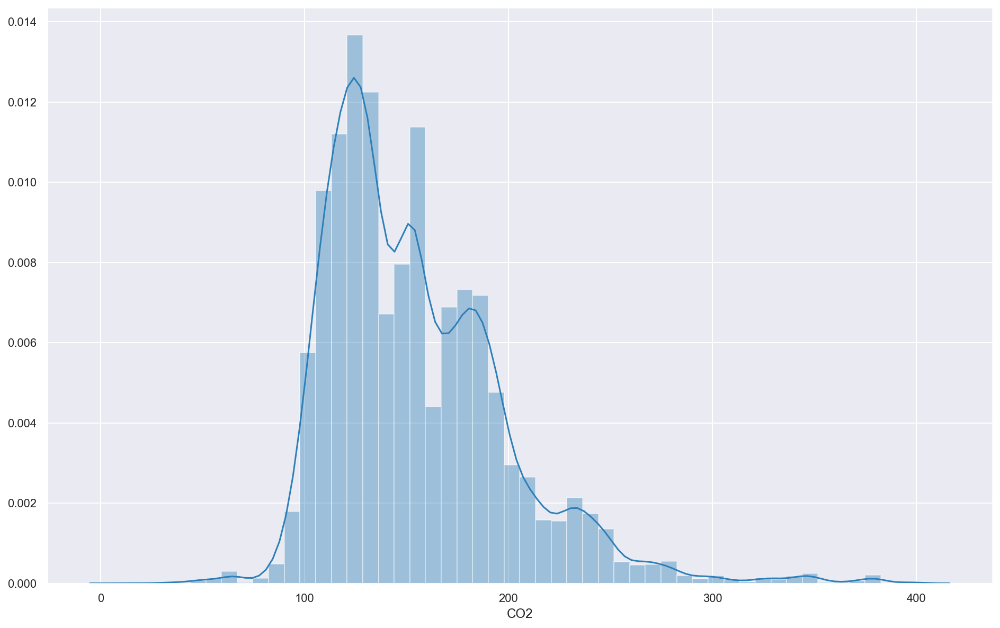

In [163]:
sns.distplot(data.CO2, color="#2c7fb8")

<AxesSubplot:xlabel='CO2', ylabel='count'>

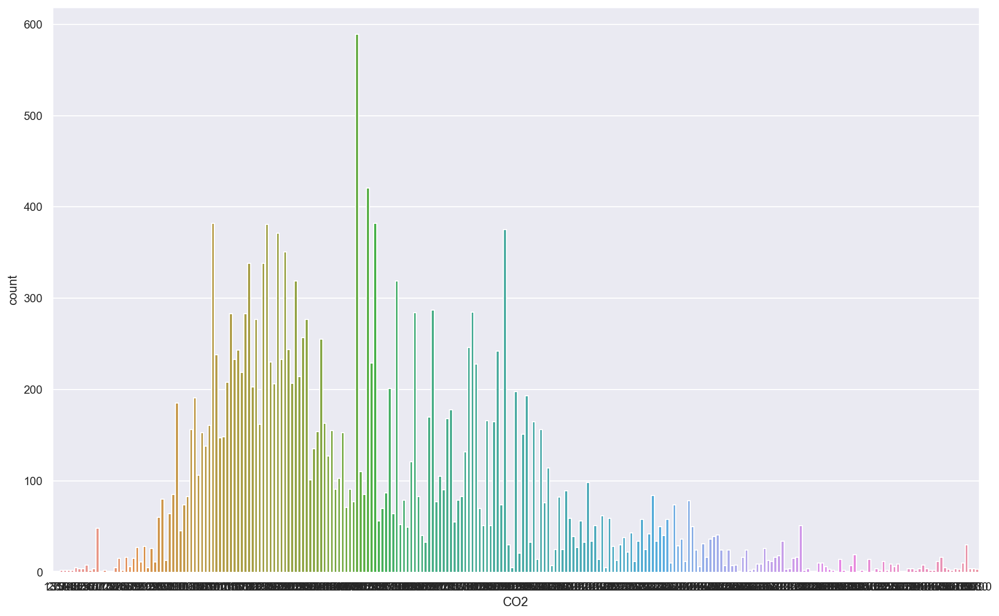

In [164]:
sns.countplot(x='CO2', data=data)

<AxesSubplot:xlabel='CO_1'>

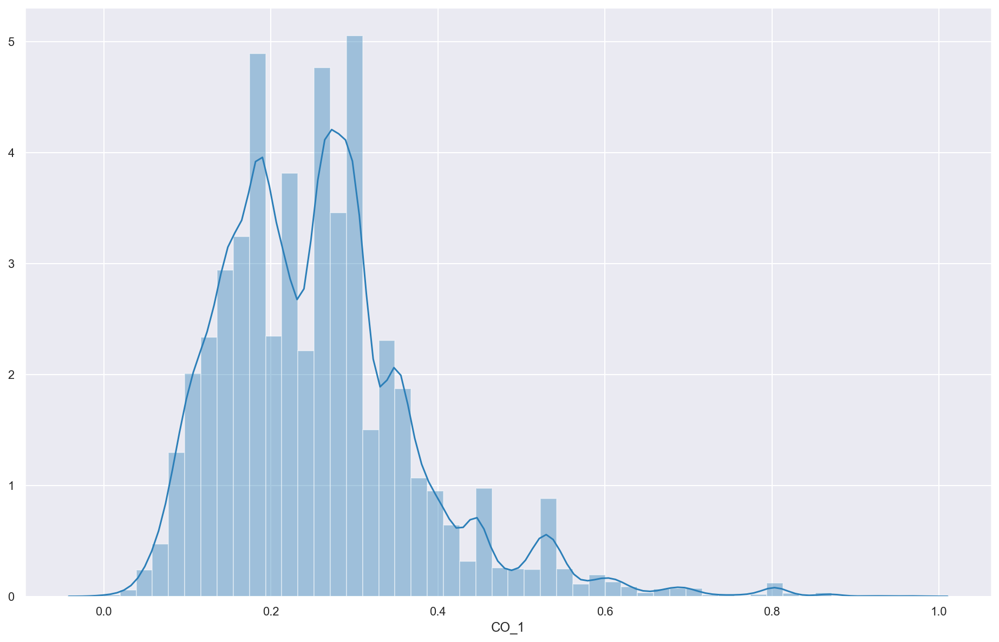

In [165]:
sns.distplot(data.CO_1, color="#2c7fb8")

<AxesSubplot:xlabel='NOC', ylabel='count'>

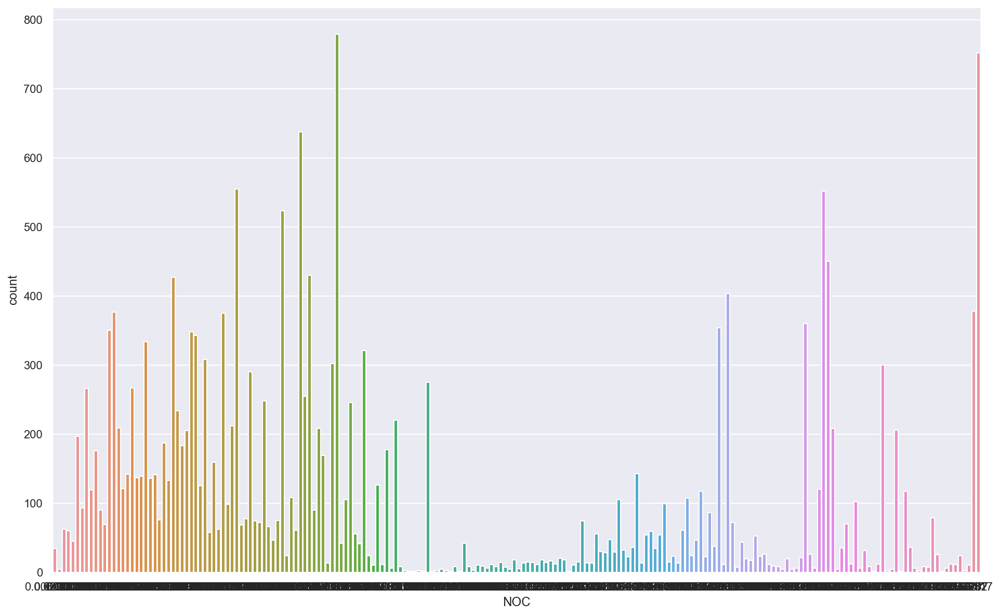

In [177]:
sns.countplot(x='NOC', data=data)

<AxesSubplot:xlabel='Max_HP'>

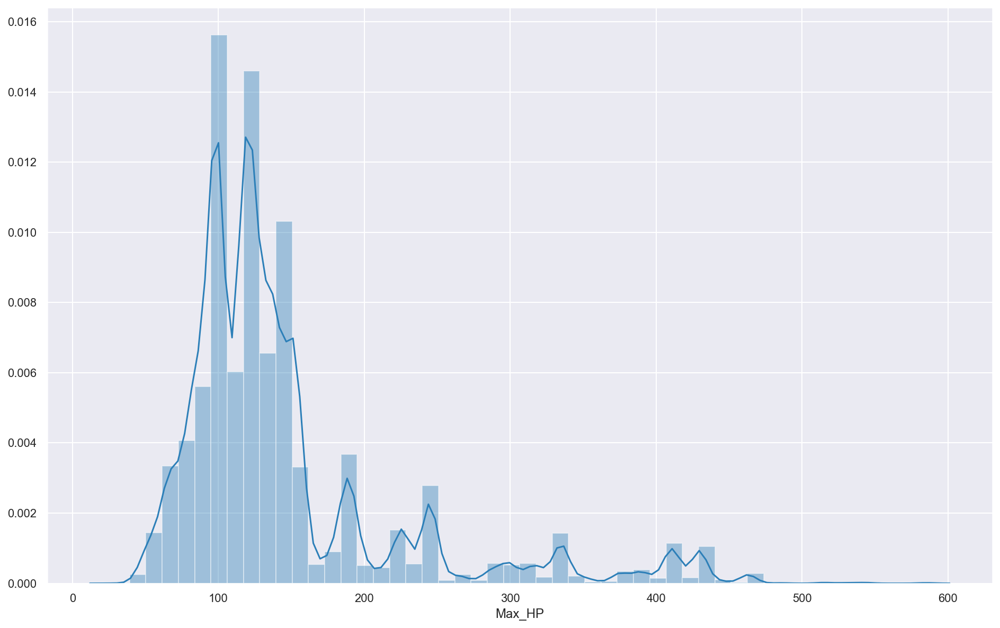

In [167]:
sns.distplot(data.Max_HP, color="#2c7fb8")

<AxesSubplot:xlabel='City_Mileage'>

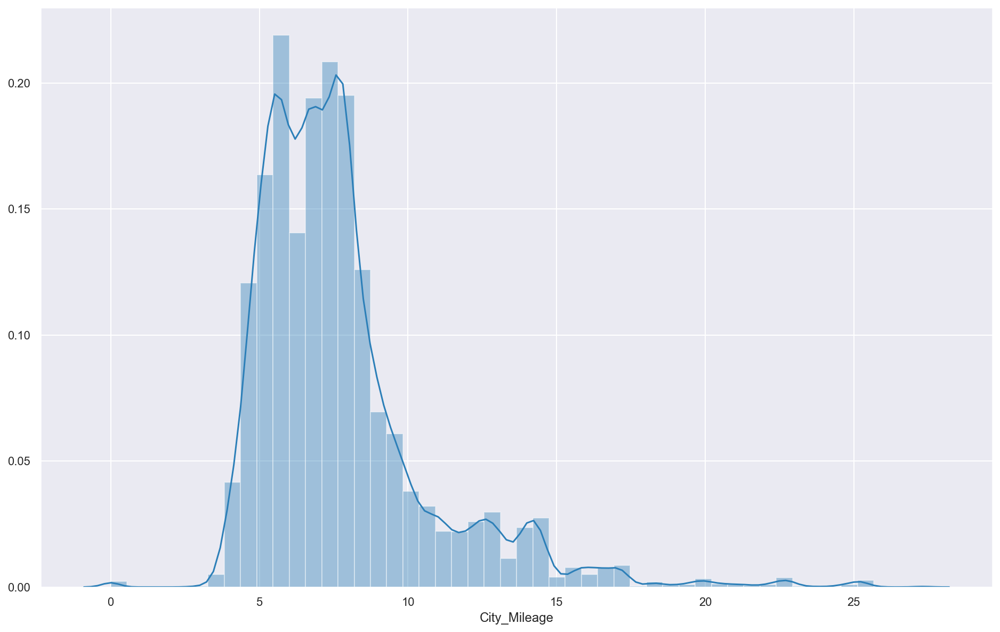

In [168]:
sns.distplot(data.City_Mileage, color="#2c7fb8")

<AxesSubplot:xlabel='Hway_Mileage'>

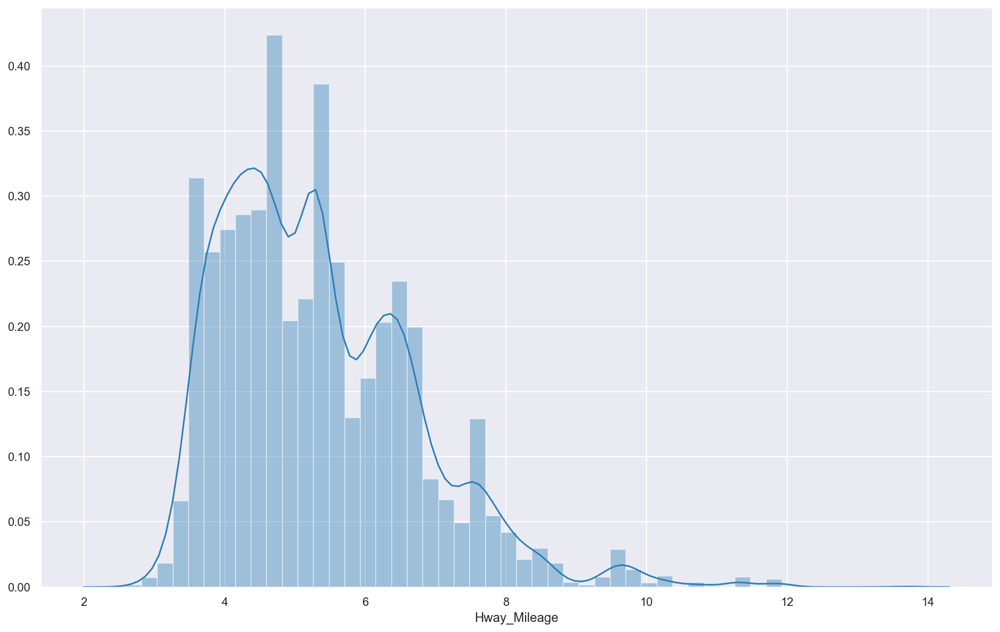

In [180]:
sns.distplot(data.Hway_Mileage, color="#2c7fb8")

<AxesSubplot:xlabel='Mix_Mileage'>

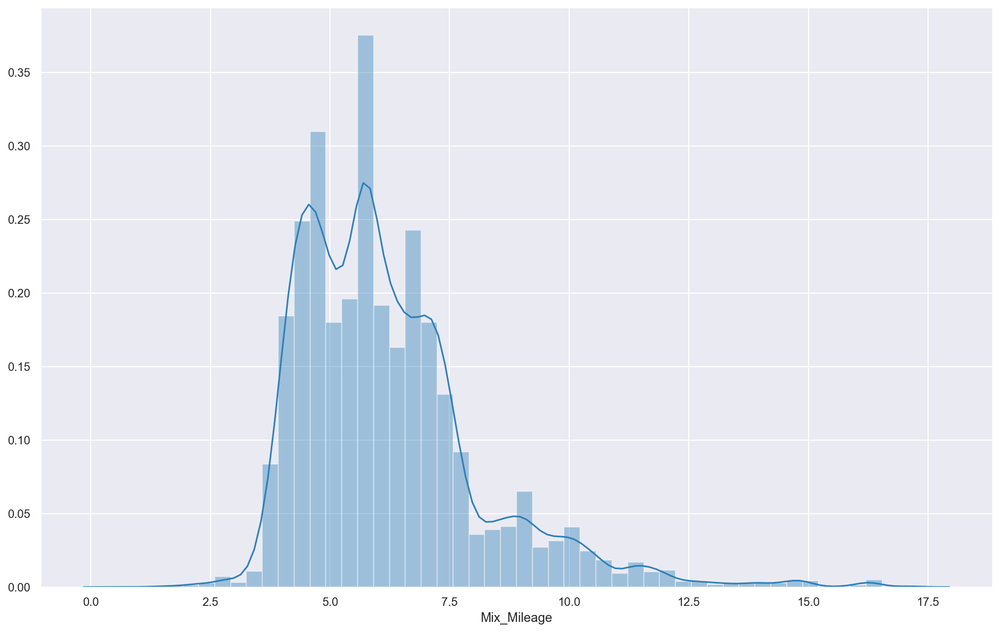

In [184]:
sns.distplot(data.Mix_Mileage, color="#2c7fb8")

<AxesSubplot:xlabel='NOC'>

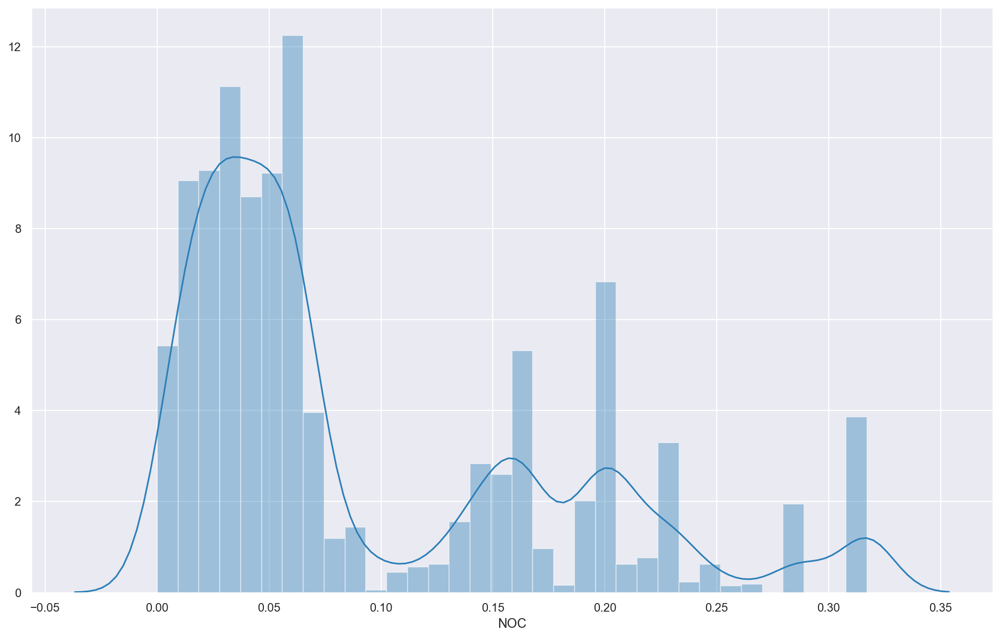

In [171]:
sns.distplot(data.NOC, color="#2c7fb8")

<AxesSubplot:xlabel='HCNOX'>

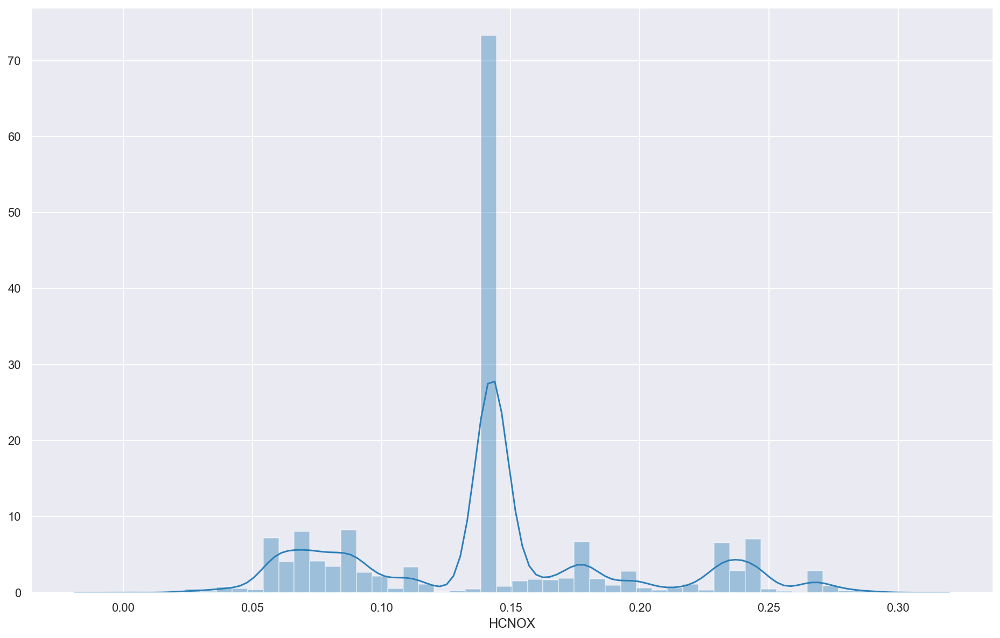

In [172]:
sns.distplot(data.HCNOX, color="#2c7fb8")

<AxesSubplot:xlabel='PTCL'>

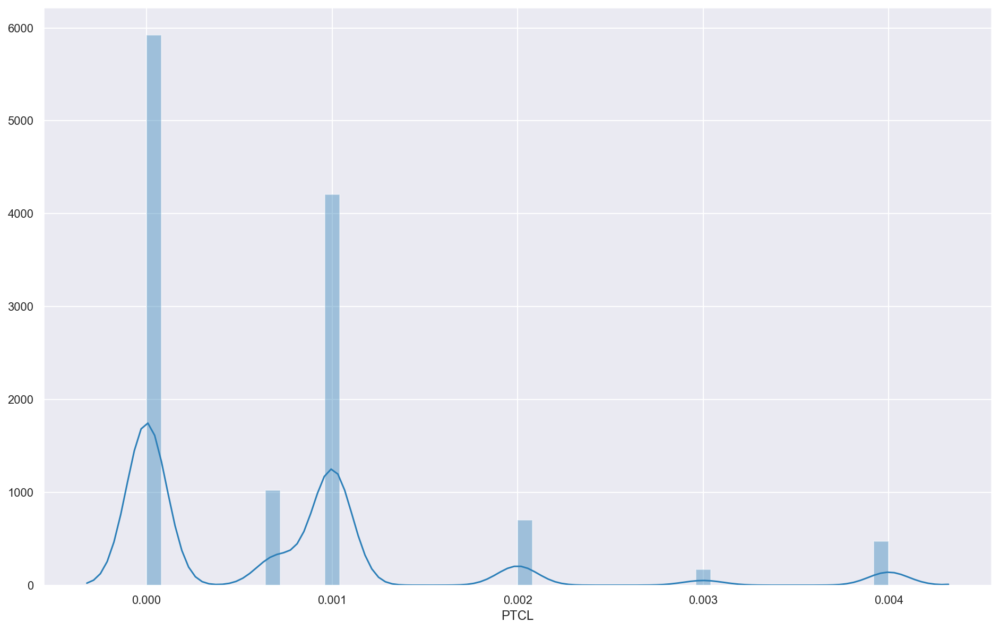

In [173]:
    sns.distplot(data.PTCL, color="#2c7fb8")

<AxesSubplot:xlabel='Min_Wght'>

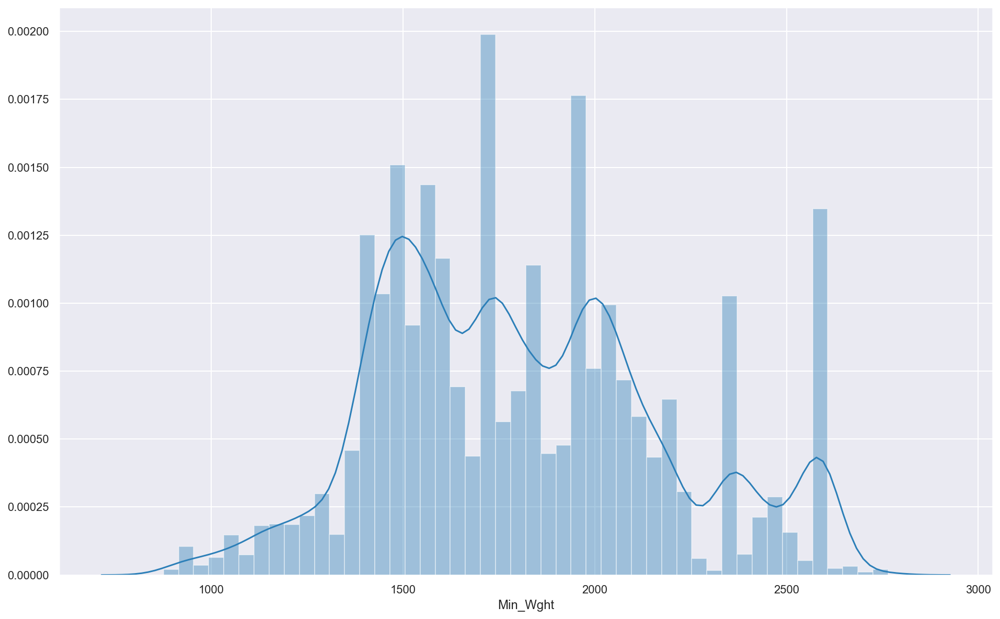

In [174]:
sns.distplot(data.Min_Wght, color="#2c7fb8")

<AxesSubplot:xlabel='Max_Wght'>

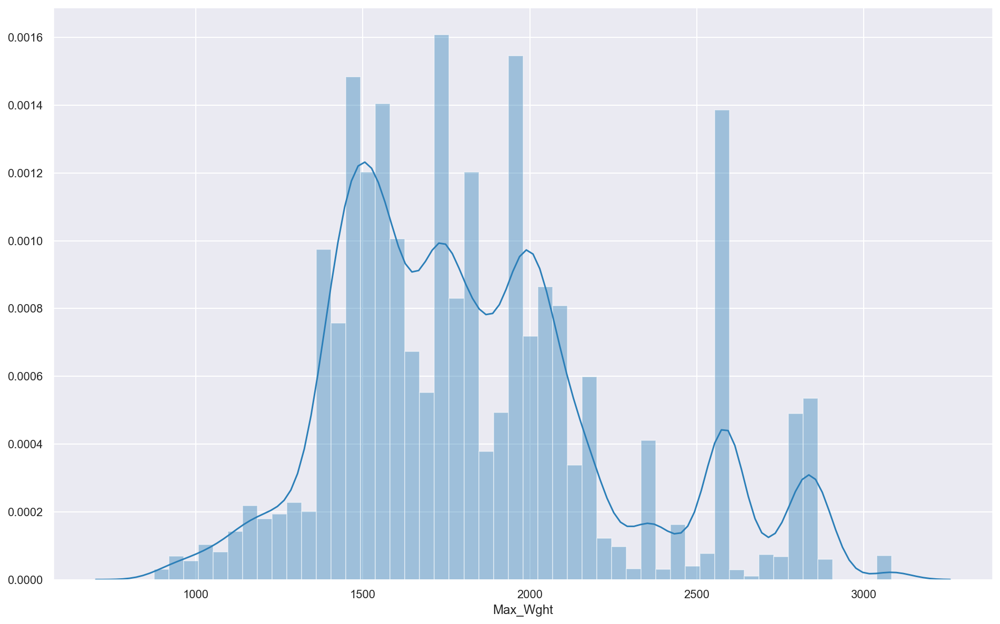

In [175]:
sns.distplot(data.Max_Wght, color="#2c7fb8")

### Categorical Feature Distribution

In [185]:
data.Gas.describe()

count     20880
unique       13
top         GO 
freq      12675
Name: Gas, dtype: object

<AxesSubplot:>

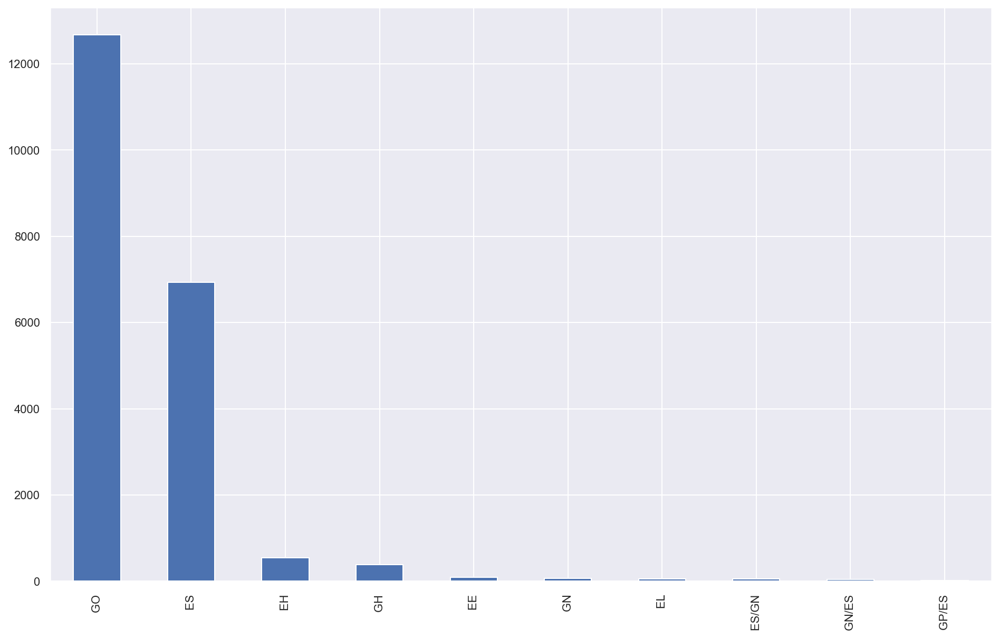

In [187]:
data['Gas'].value_counts().head(10).plot.bar()

<AxesSubplot:xlabel='CO2', ylabel='Gear'>

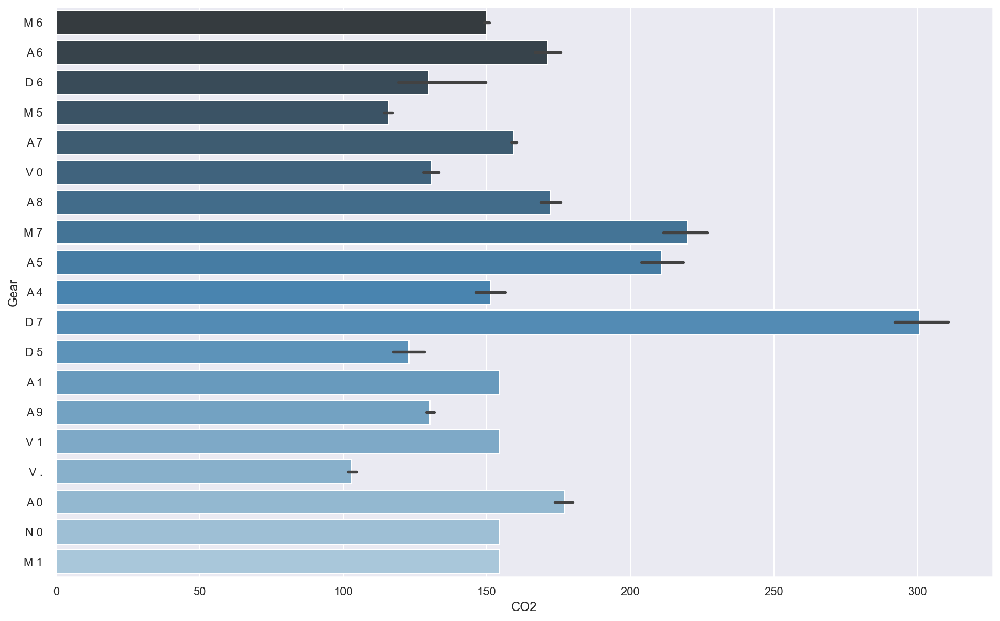

In [188]:
sns.barplot(x="CO2", y="Gear", data=data, palette="Blues_d")

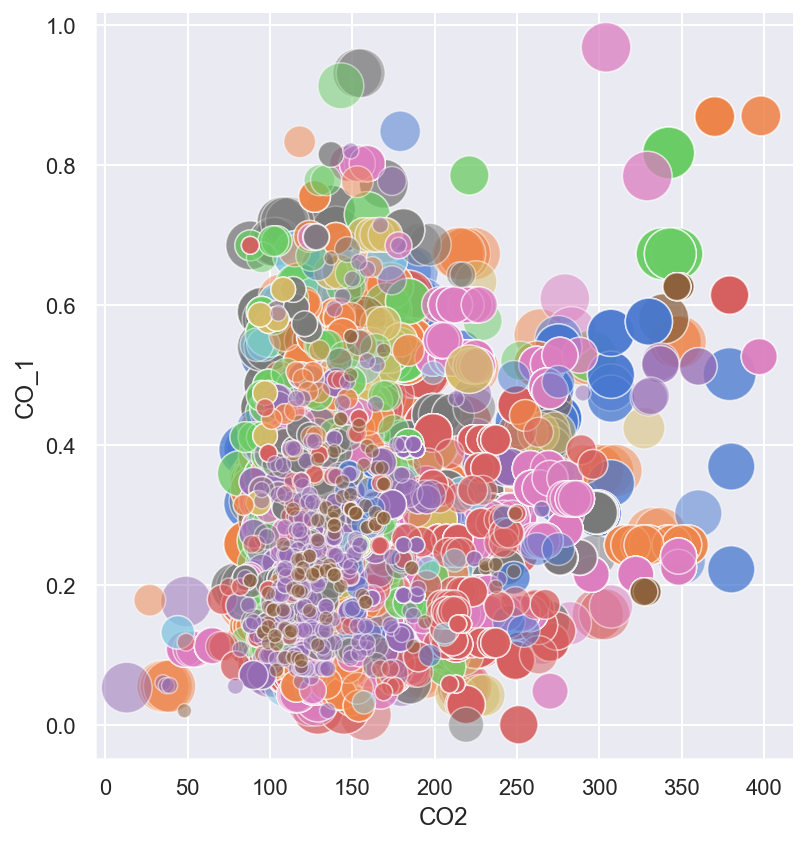

In [189]:
make = sns.relplot(x="CO2", y="CO_1", hue="Make", size="Make",
            sizes=(50, 700), alpha=.5, palette="muted",
            height=6, data=data)

make._legend.remove()

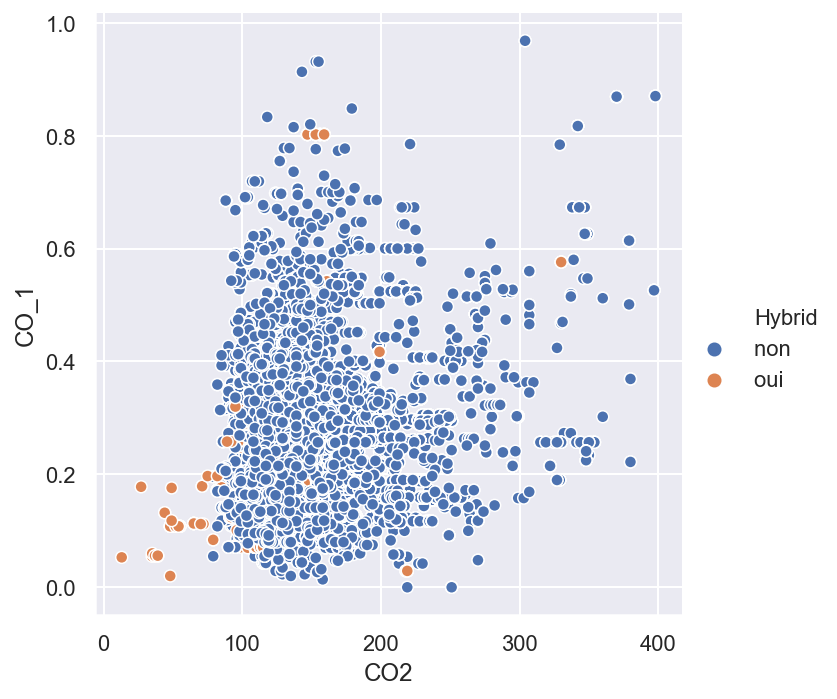

In [190]:
sns.relplot(x="CO2", y="CO_1", hue="Hybrid",sizes=(15, 200),  data=data);

### Finding Correlations

In [191]:
corr = data.corr()
corr.style.background_gradient(cmap='coolwarm')

,Max_HP,City_Mileage,Hway_Mileage,Mix_Mileage,CO2,CO_1,NOC,HCNOX,PTCL,Min_Wght,Max_Wght
Max_HP,1.000000,0.747745,0.634397,0.706758,0.646613,0.087361,-0.319773,-0.120275,0.011065,0.213354,0.152792
City_Mileage,0.747745,1.000000,0.899783,0.974347,0.929050,0.206369,-0.028043,0.214266,0.163849,0.383465,0.366347
Hway_Mileage,0.634397,0.899783,1.000000,0.960384,0.961284,0.173377,0.197706,0.347551,0.251631,0.647890,0.639593
Mix_Mileage,0.706758,0.974347,0.960384,1.000000,0.976291,0.202805,0.080566,0.278869,0.209523,0.508459,0.495627
CO2,0.646613,0.929050,0.961284,0.976291,1.000000,0.177292,0.232335,0.323238,0.242145,0.623785,0.613378
CO_1,0.087361,0.206369,0.173377,0.202805,0.177292,1.000000,-0.004153,0.218896,0.046481,-0.038559,-0.024718
NOC,-0.319773,-0.028043,0.197706,0.080566,0.232335,-0.004153,1.000000,0.593123,0.355428,0.601733,0.648749
HCNOX,-0.120275,0.214266,0.347551,0.278869,0.323238,0.218896,0.593123,1.000000,-0.064209,0.322869,0.354623
PTCL,0.011065,0.163849,0.251631,0.209523,0.242145,0.046481,0.355428,-0.064209,1.000000,0.325994,0.371113
Min_Wght,0.213354,0.383465,0.647890,0.508459,0.623785,-0.038559,0.601733,0.322869,0.325994,1.000000,0.979583


In [192]:
corr_matrix = data.corr()
co2_corr = corr_matrix['CO2']
co2_corr.iloc[co2_corr.abs().argsort()]

CO_1            0.177292
NOC             0.232335
PTCL            0.242145
HCNOX           0.323238
Max_Wght        0.613378
Min_Wght        0.623785
Max_HP          0.646613
City_Mileage    0.929050
Hway_Mileage    0.961284
Mix_Mileage     0.976291
CO2             1.000000
Name: CO2, dtype: float64

Plotting Target Variable vs Numeric Varaibles

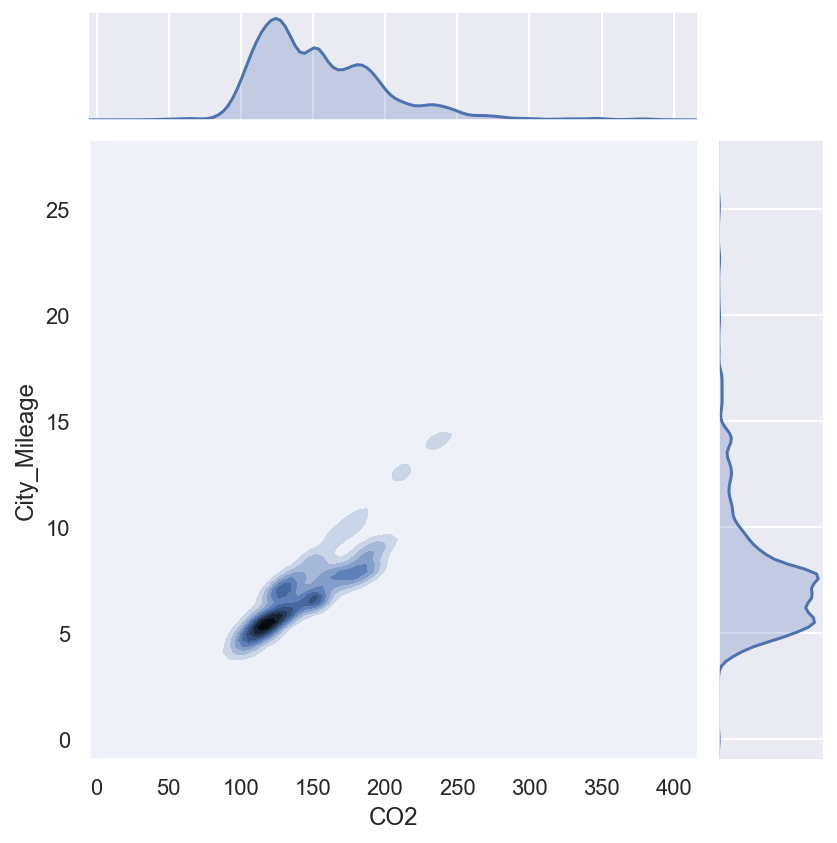

In [195]:
sns.jointplot(x='CO2',y='City_Mileage',data=data,kind='kde')

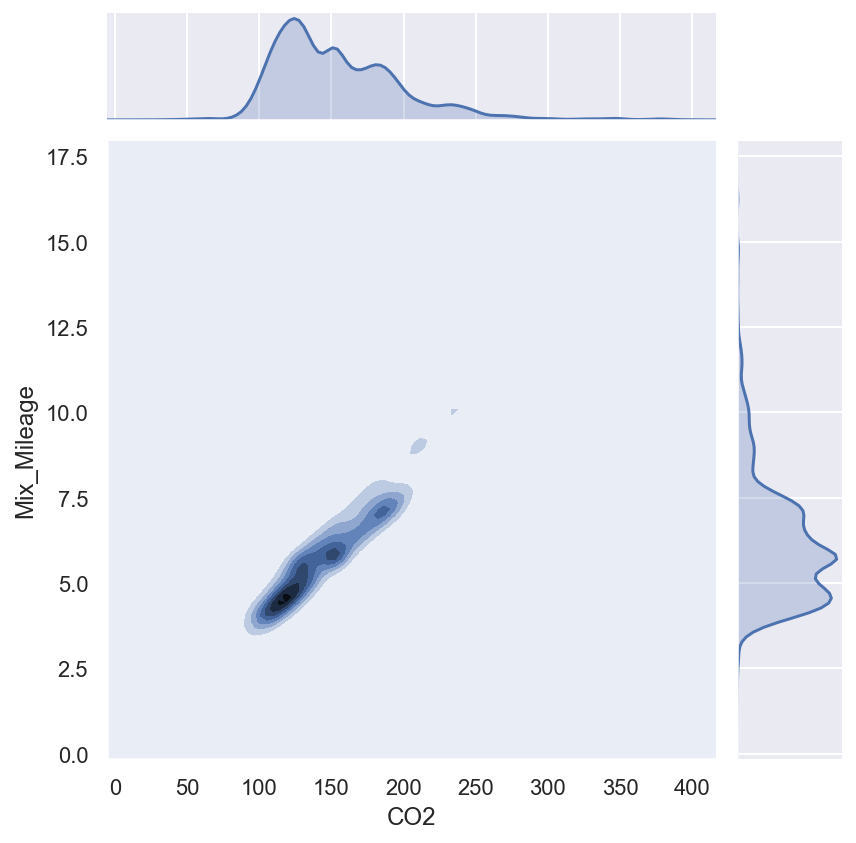

In [196]:
sns.jointplot("CO2","Mix_Mileage",data,kind='kde');

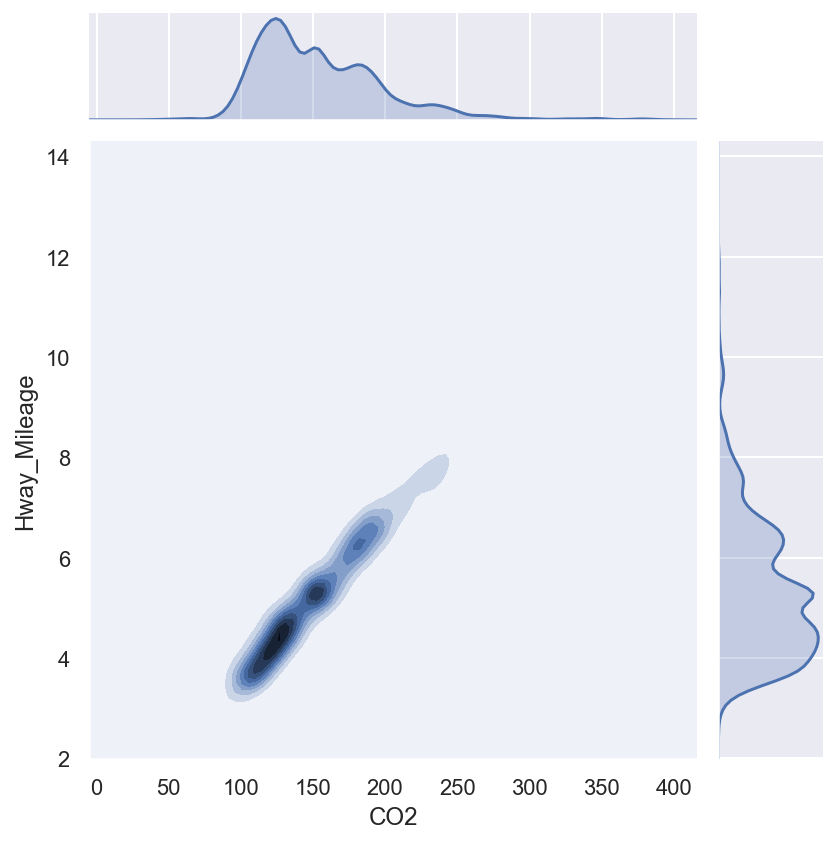

In [198]:
sns.jointplot("CO2","Hway_Mileage",data,kind='kde');

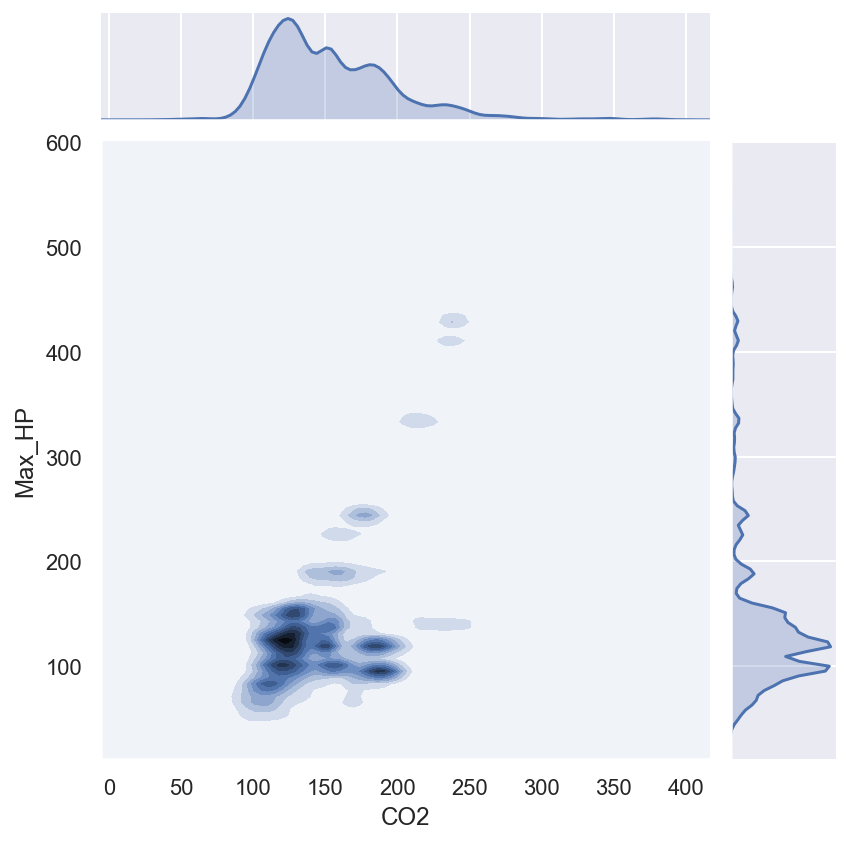

In [199]:
sns.jointplot("CO2","Max_HP",data,kind='kde');
#plt.show()

# Data Preparation

- Remove unnecessary columns
- Transform any categorical features to numbers/vectors
- Scale numerical features

b. Dropping Features
+ Trim dataset to Gas to "ES" and "GO" for petrol and diesel engines 
+ The Hybrid Feature has over 90% set to "Non", therefore this categorical variable will not be useful for regression.
+ The Gears Feature has 19 different categories, this will create too many dummy variables after applying one-hot encoding. Regression does not work well with a lot of variables. Make and Model also have too many categories.

In [200]:
# Applying One-Hot Encoding to Make Dummy Variables

data = data[data.Gas.isin(["ES ","GO "])] # Only collect ES and GO fuel types

In [201]:
data = pd.get_dummies(data, columns=['Gas'])

# Dropping Unnecessary Features

In [203]:
data.drop('Hybrid', inplace=True, axis=1)
data.drop('Make', inplace=True, axis=1)
data.drop('Model', inplace=True, axis=1)
data.drop('Gear', inplace=True, axis=1)

## Outlier Detection and Treatment

Detecting outliers in all numeric features

<AxesSubplot:xlabel='CO2'>

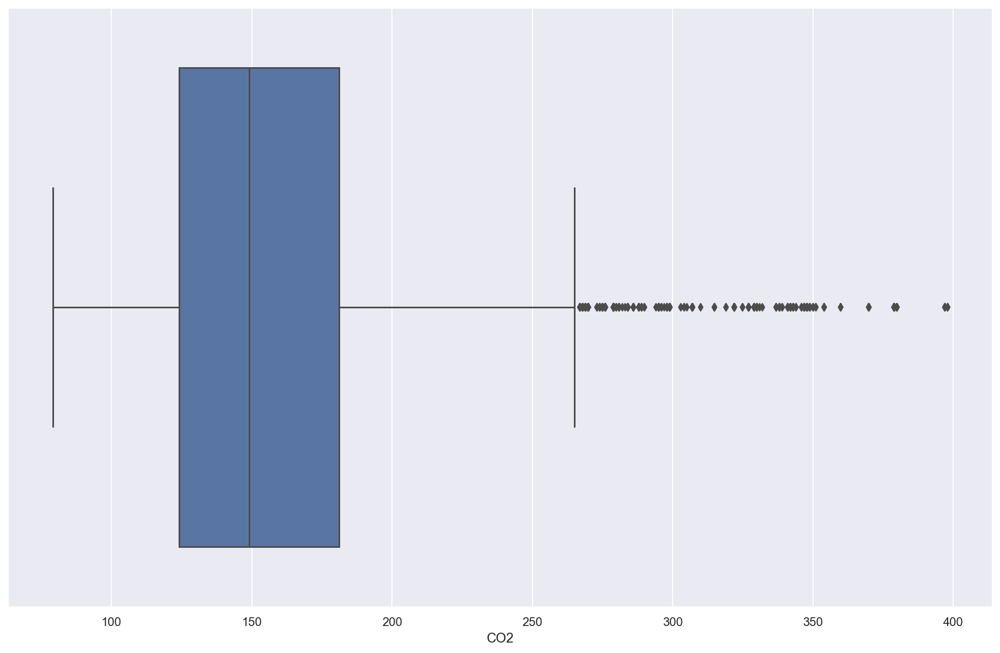

In [204]:
sns.boxplot(x=data["CO2"])

<AxesSubplot:xlabel='Mix_Mileage'>

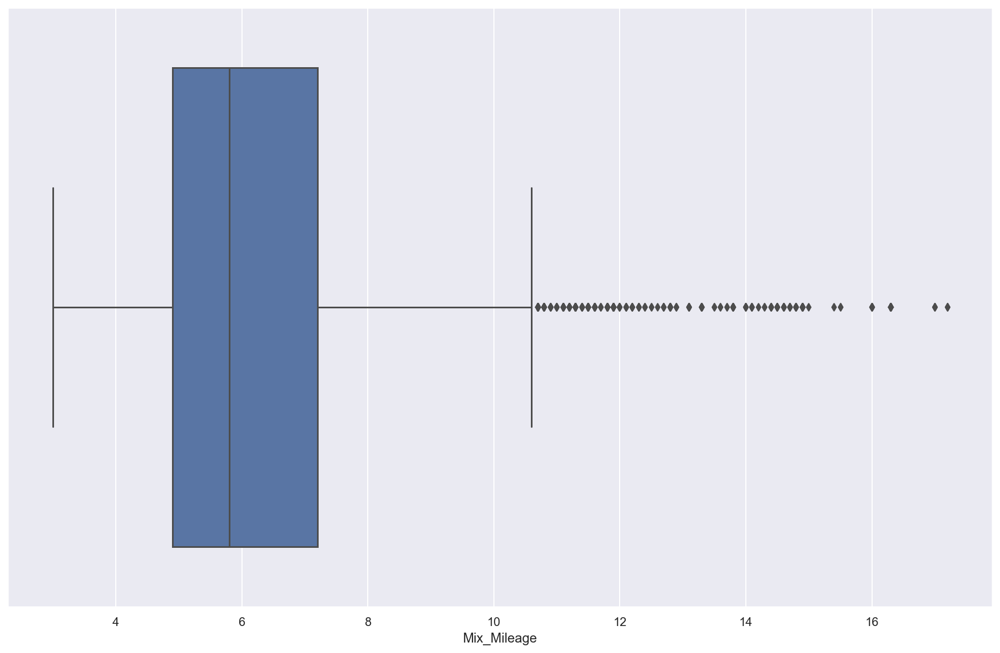

In [205]:
sns.boxplot(x=data["Mix_Mileage"])

<AxesSubplot:xlabel='Hway_Mileage'>

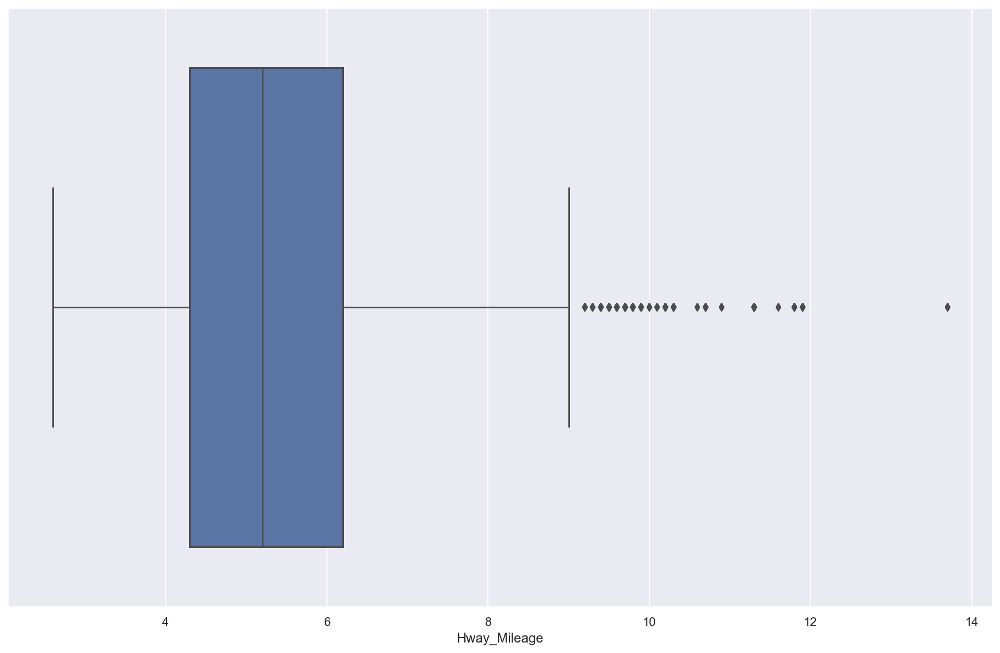

In [206]:
sns.boxplot(x=data["Hway_Mileage"]) 

<AxesSubplot:xlabel='City_Mileage'>

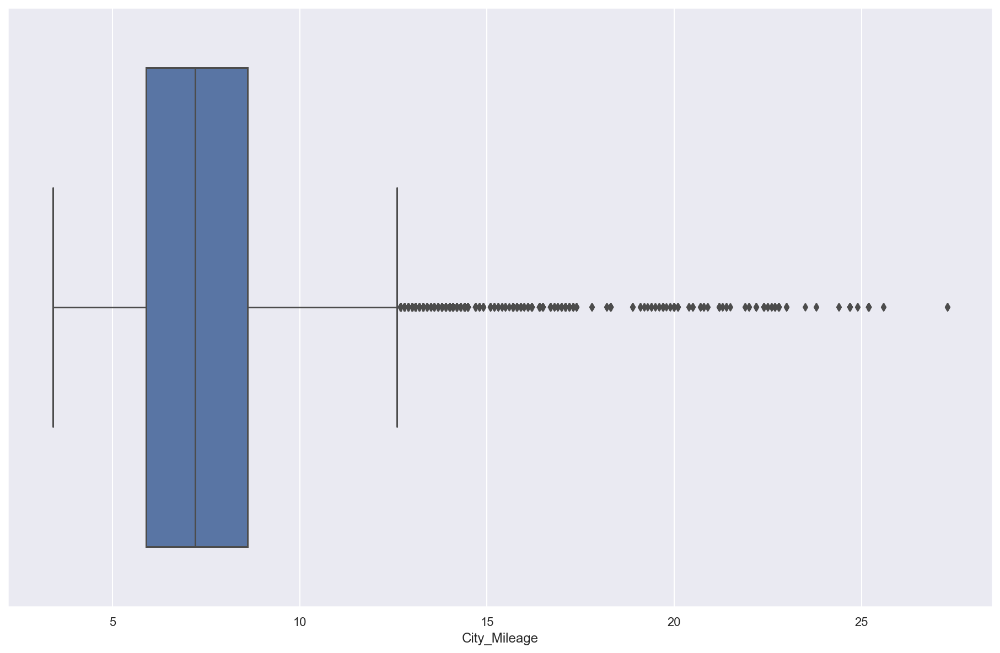

In [207]:
sns.boxplot(x=data["City_Mileage"])

<AxesSubplot:xlabel='Max_Wght'>

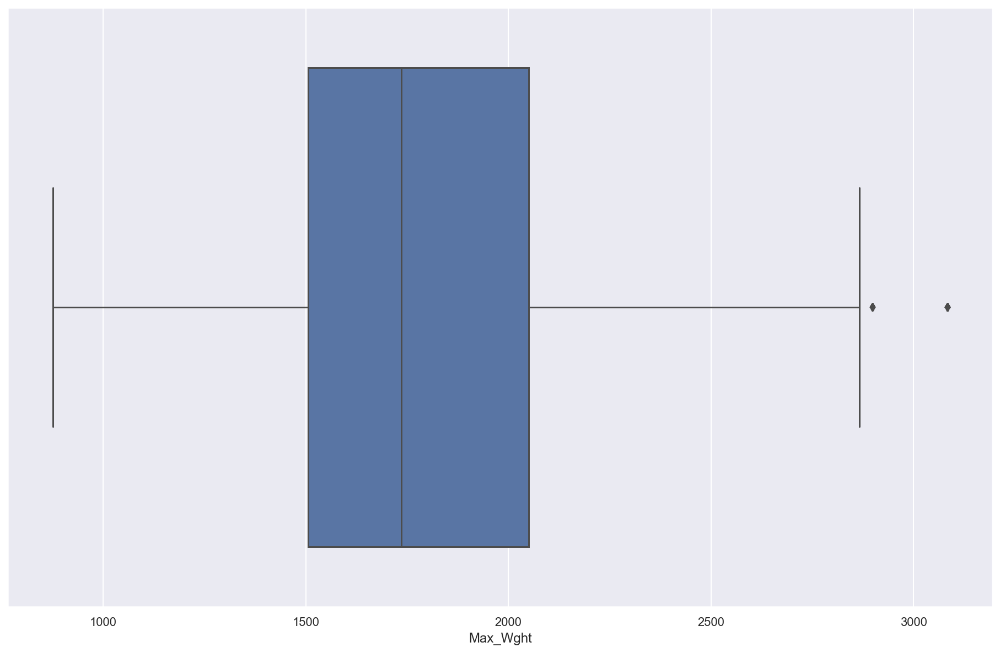

In [208]:
sns.boxplot(x=data["Max_Wght"]) 

<AxesSubplot:xlabel='Min_Wght'>

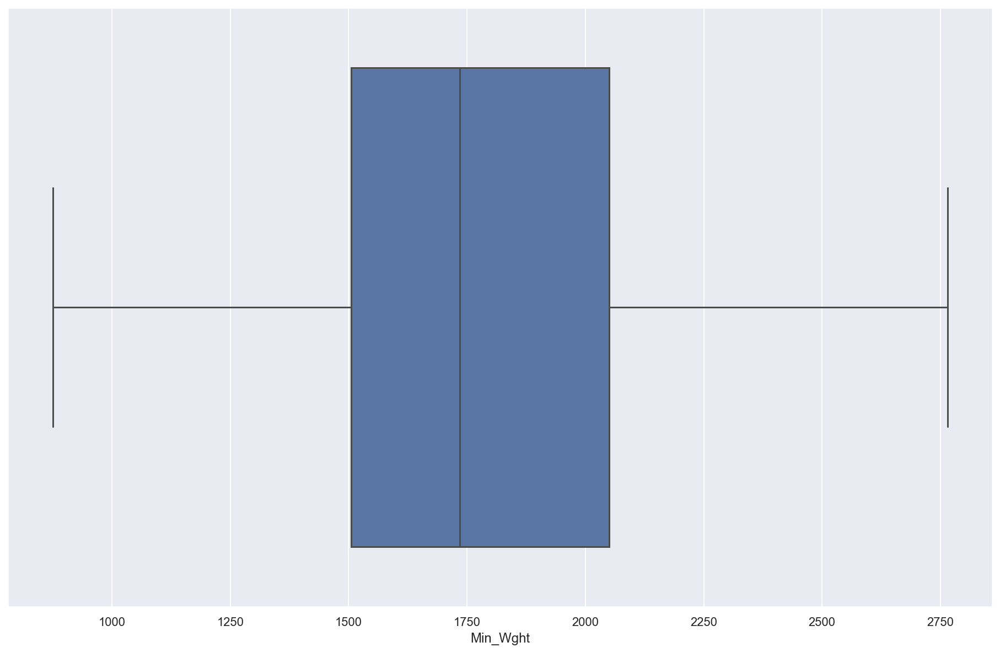

In [209]:
sns.boxplot(x=data["Min_Wght"])

<AxesSubplot:xlabel='NOC'>

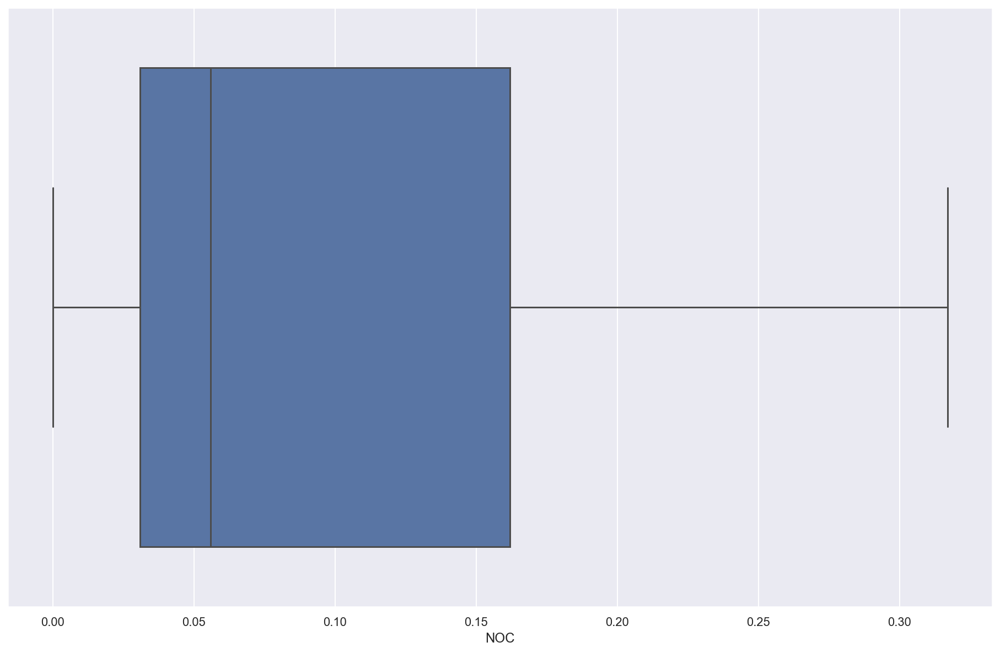

In [210]:
sns.boxplot(x=data["NOC"]) 

<AxesSubplot:xlabel='HCNOX'>

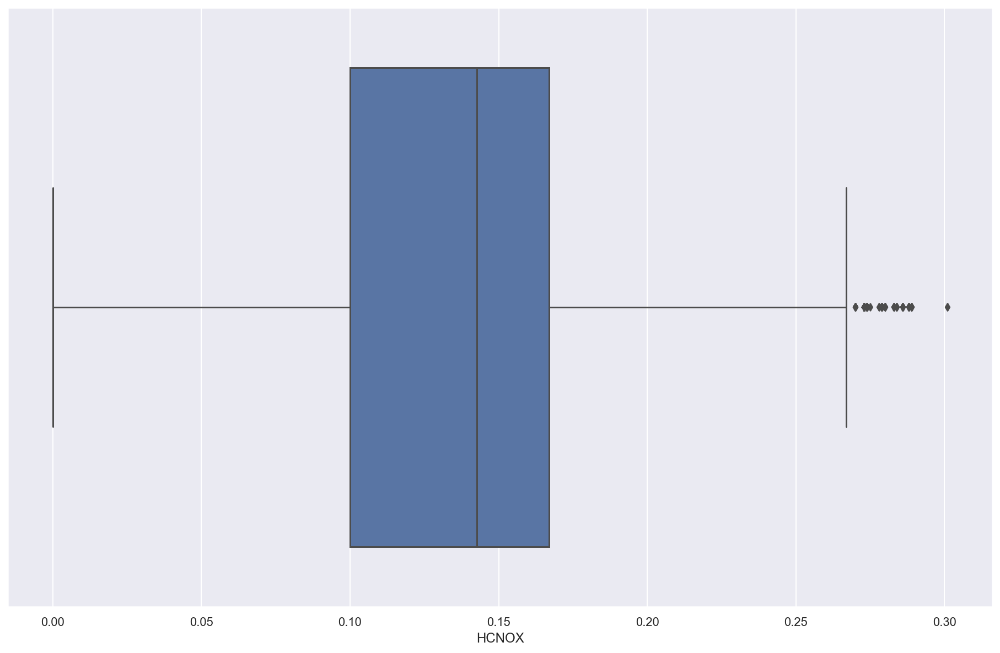

In [211]:
sns.boxplot(x=data["HCNOX"])

<AxesSubplot:xlabel='PTCL'>

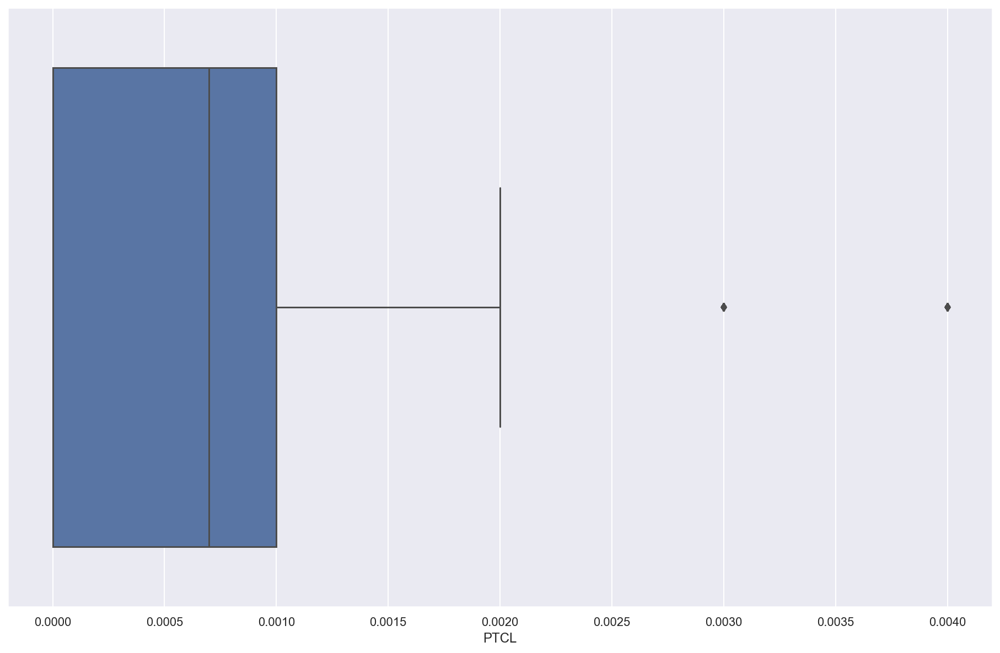

In [212]:
sns.boxplot(x=data["PTCL"]) 

# Outlier Identification

In [104]:
from statsmodels.stats.outliers_influence import variance_inflation_factor    

def calculate_vif_(data, thresh=5.0):
    variables = list(range(data.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vif = [variance_inflation_factor(data.iloc[:, variables].values, ix)
               for ix in range(data.iloc[:, variables].shape[1])]

        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + data.iloc[:, variables].columns[maxloc] +
                  '\' at index: ' + str(maxloc))
            del variables[maxloc]
            dropped = True

    print('Remaining variables:')
    print(data.columns[variables])
    return data.iloc[:, variables]

## Identifying Outliers Using Quantile Percentile Approach

In [217]:
q1 = data['CO2'].quantile(0.25)
q3 = data['CO2'].quantile(0.75)
iqr = q3 - q1
mask = data['CO2'].between(q1 - 1.5*iqr, q3 + 1.5*iqr)
outliers = data.loc[~mask, 'CO2']

In [218]:
# Detect Outliers
outliers.describe()

count      9.0
mean     265.0
std        0.0
min      265.0
25%      265.0
50%      265.0
75%      265.0
max      265.0
Name: CO2, dtype: float64

### <span style="color:red"> Removing All Outliers </span>

In [215]:
#Delete Detected Outliers
data.drop(outliers.index.values, inplace=True) 

### Exploratory Data Analysis

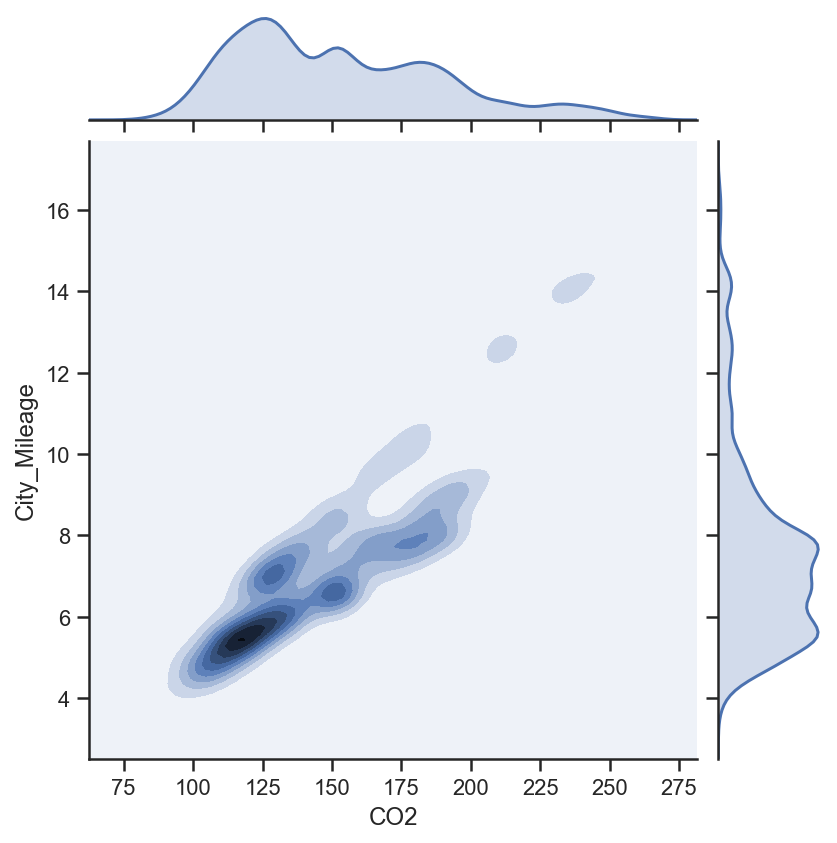

In [219]:
sns.set_style("ticks")

sns.jointplot(x='CO2',y='City_Mileage',data=data,kind='kde')

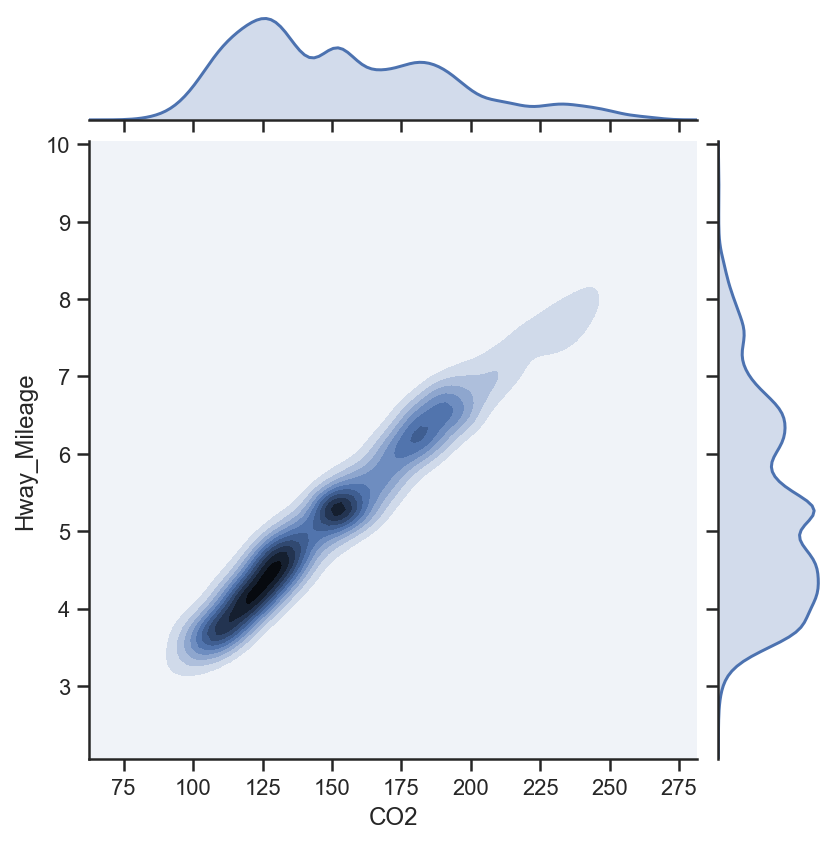

In [220]:
sns.jointplot(x='CO2',y='Hway_Mileage',data=data,kind='kde')

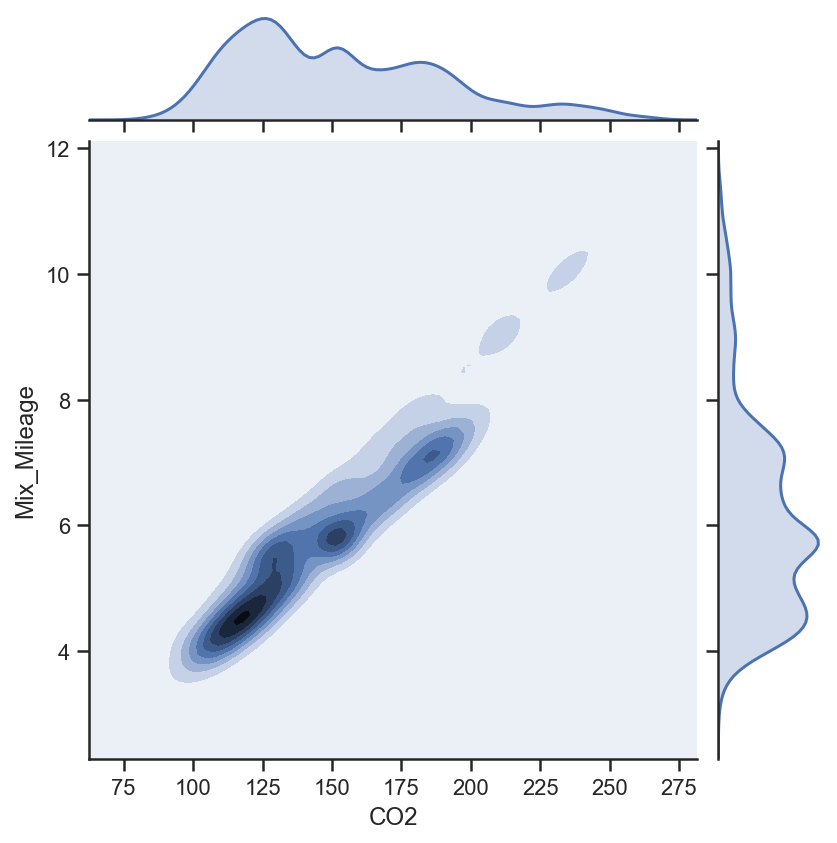

In [221]:
sns.jointplot(x='CO2',y='Mix_Mileage',data=data,kind='kde')

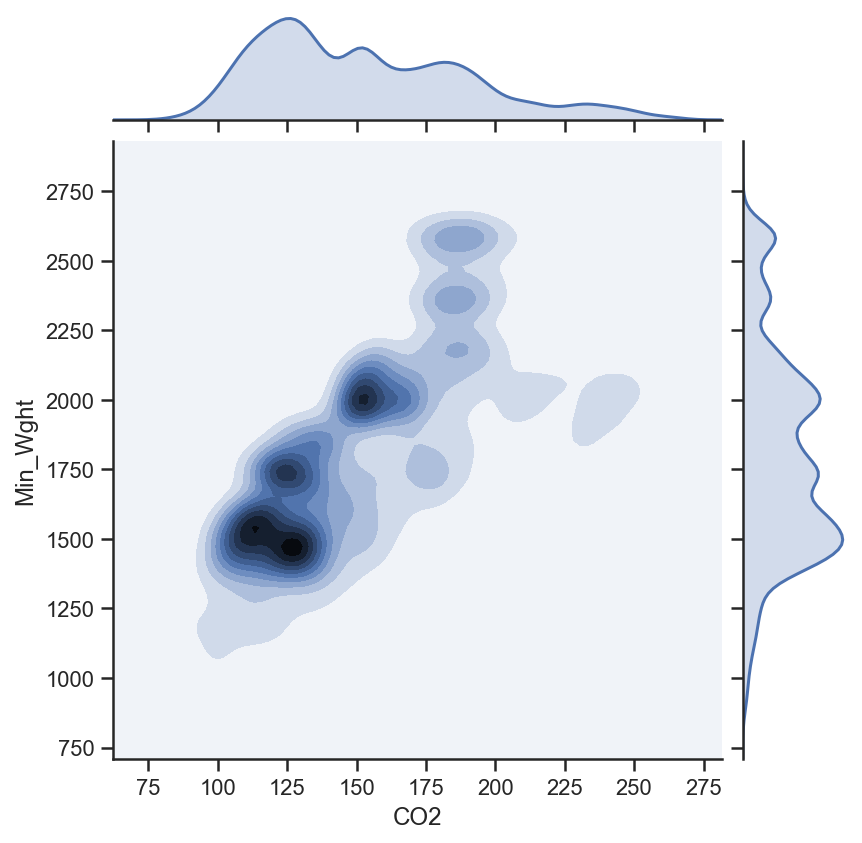

In [222]:
sns.set_style("ticks")

sns.jointplot(x='CO2',y='Min_Wght',data=data,kind='kde')

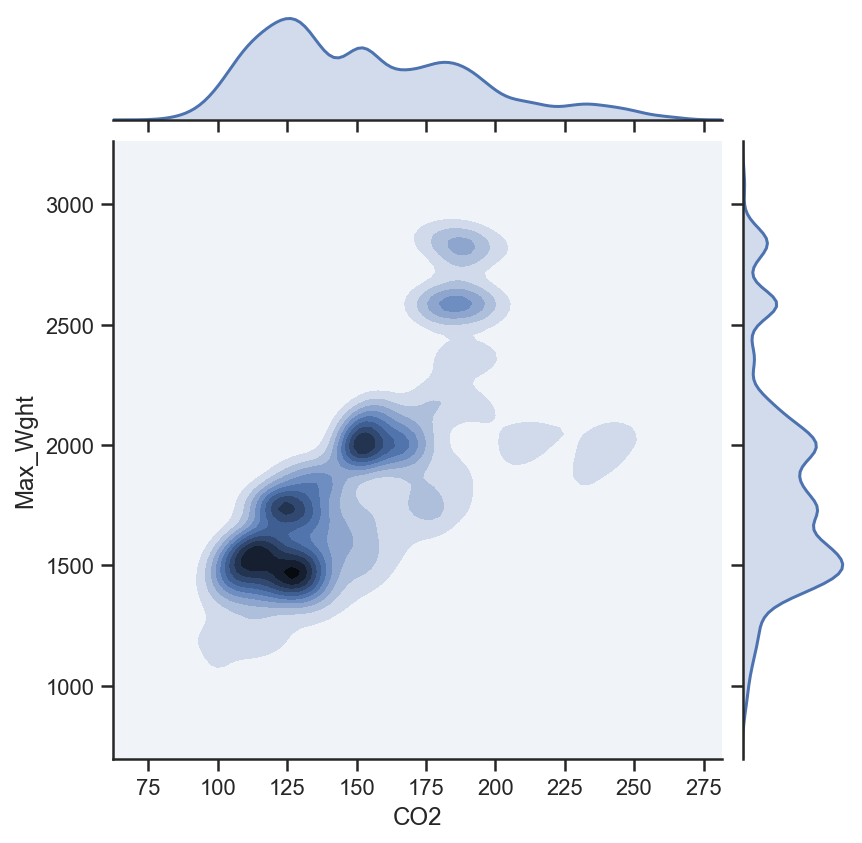

In [223]:
sns.jointplot(x='CO2',y='Max_Wght',data=data,kind='kde')

<AxesSubplot:xlabel='CO2', ylabel='CO_1'>

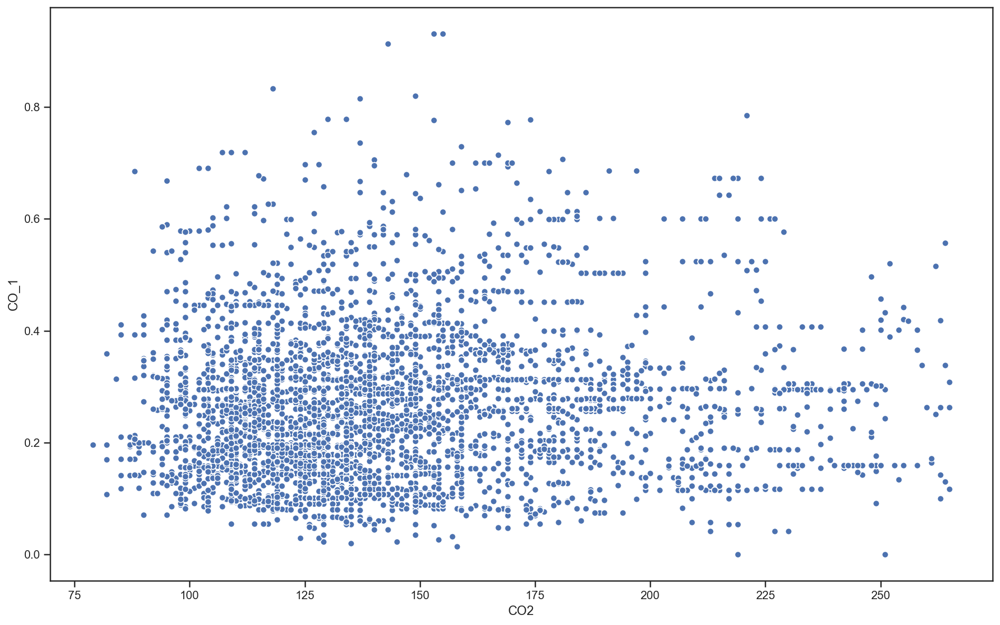

In [224]:
sns.scatterplot(x='CO2',y='CO_1',data=data)

<AxesSubplot:xlabel='CO2', ylabel='NOC'>

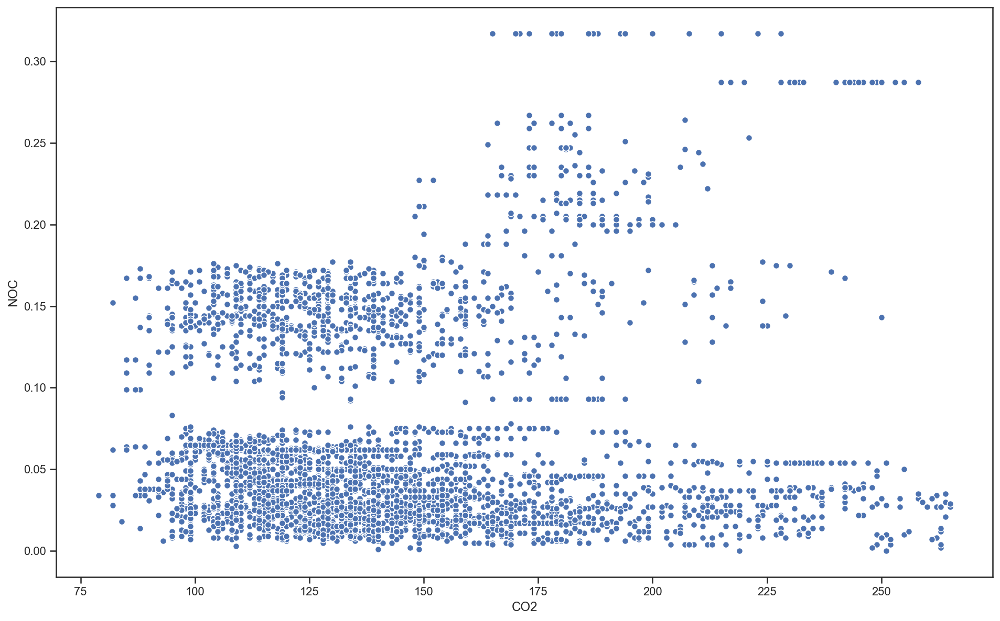

In [225]:
sns.scatterplot(x='CO2',y='NOC',data=data)

<AxesSubplot:xlabel='CO2', ylabel='HCNOX'>

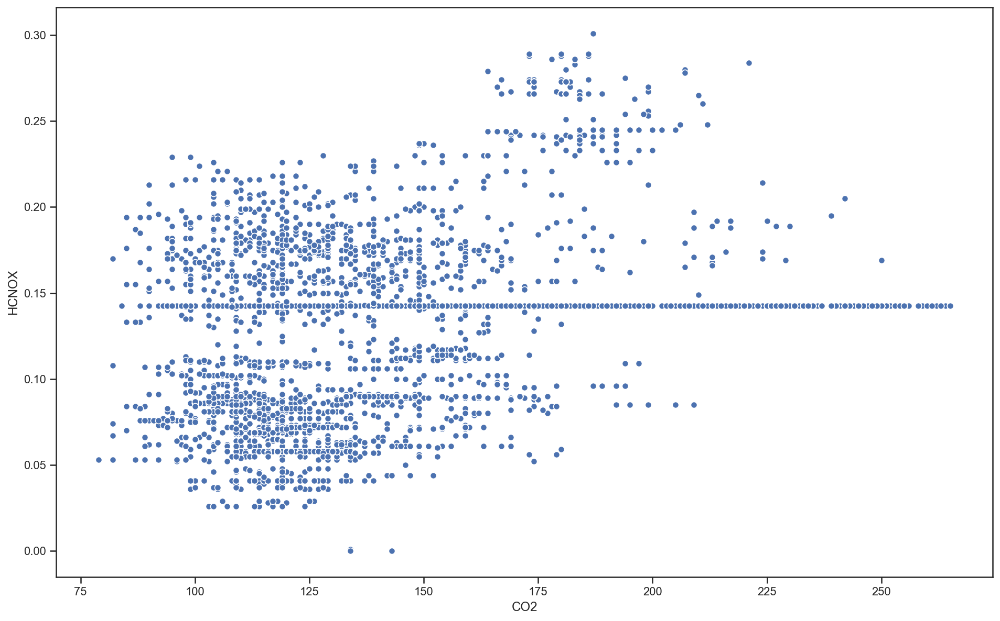

In [226]:
sns.scatterplot(x='CO2',y='HCNOX',data=data)

## <span style="color:blue"> Save Dataset without Outliers </span>
+ Main experimental dataset

In [230]:
data.to_csv('CO2_Cleaned.csv', index=False, encoding='UTF-8')

# Goodness-of-Fit Using R-Squared Score

In [228]:
train = data
labels = train["CO2"]

# Log transformation
data = np.log(data)
labels = np.log(labels)

# Change -inf to 0 again
data[data==-np.inf]=0

,R-Square Score
AdaBoost,0.993136
Linear,0.988824
Ridge,0.988595
Lasso,0.988082
SVM RBF,0.964471


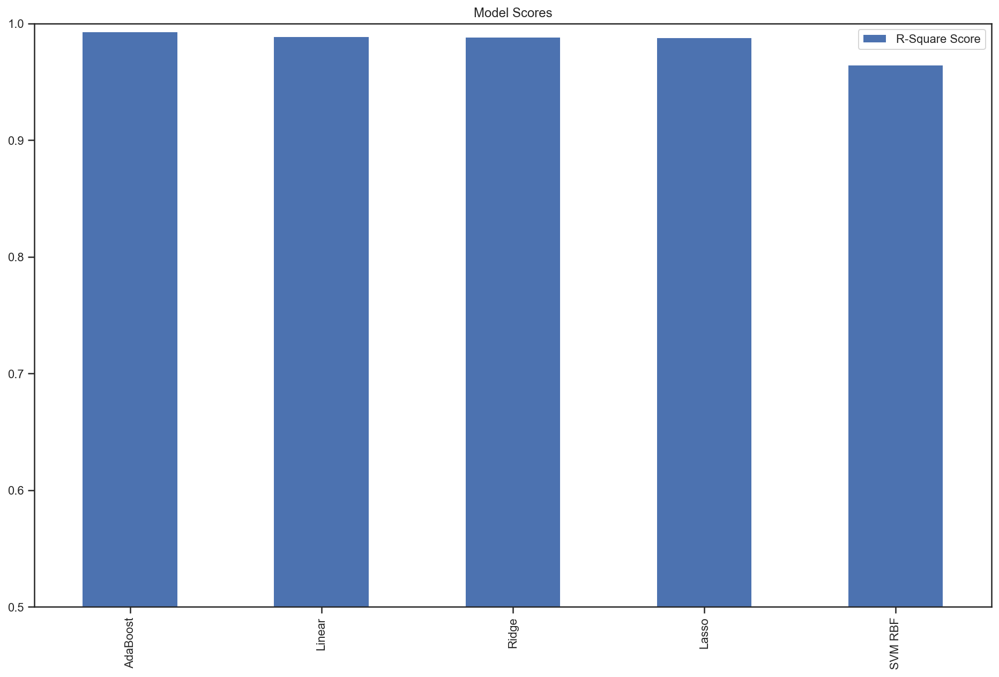

In [229]:
def simple_reg(train,labels):
    results={}
    def test_reg(clf):
        
        cv = KFold(n_splits=5,shuffle=True,random_state=45)
        r2 = make_scorer(r2_score)
        r2_val_score = cross_val_score(clf, train, labels, cv=cv,scoring=r2)
        scores=[r2_val_score.mean()]
        return scores

    
    clf = AdaBoostRegressor()
    results["AdaBoost"]=test_reg(clf)
    
    clf = linear_model.LinearRegression()
    results["Linear"]=test_reg(clf)
    
    clf = linear_model.Ridge()
    results["Ridge"]=test_reg(clf)
    
    clf = linear_model.Lasso(alpha=1e-4)
    results["Lasso"]=test_reg(clf)
    
    clf = svm.SVR()
    results["SVM RBF"]=test_reg(clf)
    
    results = pd.DataFrame.from_dict(results,orient='index')
    results.columns=["R-Square Score"] 
    results.plot(kind="bar",title="Model Scores")
    axes = plt.gca()
    axes.set_ylim([0.5,1])
    return results

simple_reg(train,labels)

# <span style="color:red">NEXT STEP: MODEL DEVELOPMENT</span>

+ 1. Regularised Linear Regression
+ 2. Artifiticial Neural Networks
+ 3. Deep Neural Networks 